# Capstone Project - The Battle of Neighborhoods

## Table of contents
* [Introduction Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem<a name="introduction"></a>
*A description of the problem and a discussion of the background. (15 marks)*

### Background

Ottawa, Ontario has a limited variety of Asian cuisines compared cities like Toronto and Vancouver. Currently, there are total of 66 Asian cuisines "registered" with Foursquare [1]. Ottawa is mainly dominated by Asian, Thai, Chinese and Vietnamese Restaurants. 

<img src="Documents\Coursera - IBM data science\capstone\workbook\AsianRest.jpg">

The rating (out of 10) for these restaurants are not very high.

<img src="Documents\Coursera - IBM data science\capstone\workbook\AsianRest_AvgRate.jpg">

The overall average rating for Asian cuisine is 6.2. 


> [1] _For the scope of the capstone course, only restaurants found in the Foursquare DB will be used._

### Business Problem

With the growing Asian community, there is craving for good Asian restaurants.
Ann, the client, just moved to Ottawa and is looking to open an Asian restaurant.
Where should Ann open her Asian restaurant?

## Data section<a name="data"></a>
*A description of the data and how it will be used to solve the problem. (15 marks)*

In order for Ann to make an informed decision to where she should open her restaurant, we need to gather some data to determine where the current Asian restaurants are located and population data. Ideally, Ann would like to open her restaurant in a highly populated area with the most Asians with low Asian restaurant competition.

1.Ottawa restaurant information will be gathered from Foursquare.
* Data gathered: Venue ID, Venue Name, Address, Geo Coordinates, Venue Category
* This data will be used to illustrate where the restaurants are located in Ottawa.

2."Asian restaurants" are defined as Noodle House, Chinese, Sushi, Vietnamese, Thai, Asian, Japanse, Korean categories.
* Subset of Ottawa restaurants.
* Specific venue data gathered: Venue ID, Ratings, Stats,Price, Likes.
* This data will be used to group similar venues together to get a better idea of the Asian restaurants in Ottawa.

3.Ottawa Population data (http://data.ottawa.ca/group/demographics).
* Population data by neighbourhood.
* This data will be used to help determine the neighbourhoods with the highest population density.

3a.Asian Population data by ward (http://data.ottawa.ca/group/demographics).
* Unfortunately, there were not data by neighbourhood.
* This data will be used to determine the areas in Ottawa where there is the highest Asian population

##  Methodology<a name="methodology"></a>


The Methodology section will describe the main components of our analysis and predication system. The Methodology section comprises four stages:

1. Collect Inspection Data
2. Explore and Understand Data
3. Data preparation and preprocessing 
4. Modeling



### Libraries Import

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


In [ ]:
# https://python-graph-gallery.com/292-choropleth-map-with-folium/
url ="https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json"

import json,urllib.request
data1 = urllib.request.urlopen(url).read()
UsJson = json.loads(data1)
print('GeoJSON file downloaded!')    
US=UsJson['features']
US[0]

## Ottawa Boundaries

In [2]:
import json,urllib.request
data = urllib.request.urlopen("http://data.ottawa.ca/dataset/302ade92-51ec-4b26-a715-627802aa62a8/resource/f1163794-de80-4682-bda5-b13034984087/download/onsboundariesgen1.shp.json").read()
OttawaJson = json.loads(data)
print('OttawaJson file downloaded!')
neighborhoods_data = OttawaJson['features']
neighborhoods_data[0]


OttawaJson file downloaded!


{'type': 'Feature',
 'properties': {'Name': 'Orleans Industrial',
  'Name_FR': 'Orléans Industriel',
  'Cen2011POP': 144,
  'ONS_ID': 77},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[-75.54606599964163, 45.46922800013356, 0.0],
    [-75.54585299974892, 45.468956000453126, 0.0],
    [-75.54581600092881, 45.46890200000176, 0.0],
    [-75.54578500022524, 45.4688630006609, 0.0],
    [-75.54578000025845, 45.468856000347074, 0.0],
    [-75.54577799931815, 45.46885399946053, 0.0],
    [-75.54534600074129, 45.468312999832335, 0.0],
    [-75.54520499982901, 45.46813600036483, 0.0],
    [-75.54499500035436, 45.467870000019786, 0.0],
    [-75.54498199955896, 45.46785499969084, 0.0],
    [-75.54471400000493, 45.467516000287866, 0.0],
    [-75.54425200003372, 45.467168000070934, 0.0],
    [-75.54414499944717, 45.46708800059989, 0.0],
    [-75.54253600068964, 45.46621999973552, 0.0],
    [-75.54253599971229, 45.46621899999321, 0.0],
    [-75.54176300000498, 45.46579900005108, 0.0],
    [-75

In [3]:
df = json_normalize(neighborhoods_data) # flatten JSON
df.head()

,geometry.coordinates,geometry.type,properties.Cen2011POP,properties.Name,properties.Name_FR,properties.ONS_ID,type
0,"[[[-75.54606599964163, 45.46922800013356, 0.0]...",Polygon,144,Orleans Industrial,Orléans Industriel,77,Feature
1,"[[[-75.65159200066378, 45.44944799970965, 0.0]...",Polygon,451,Beechwood Cemetery,Cimetière Beechwood,5,Feature
2,"[[[-75.64888299945507, 45.443626000242475, 0.0...",Polygon,375,Notre-Dame Cemetery,Cimetière Notre-Dame,71,Feature
3,"[[[-75.68980047571759, 45.38469981324699, 0.0]...",Polygon,0,Carleton University,Université Carleton,17,Feature
4,"[[[[-75.72706517560587, 45.41484936169896, 0.0...",MultiPolygon,370,Lebreton Development,Développement Lebreton,60,Feature


In [4]:
list(df['properties.Name'].unique())

['Orleans Industrial',
 'Beechwood Cemetery',
 'Notre-Dame Cemetery',
 'Carleton University',
 'Lebreton Development',
 'Barrhaven',
 'Bayshore - Belltown',
 'Beacon Hill South - Cardinal Heights',
 'Beaverbrook',
 'Bells Corners East',
 'Bells Corners West',
 'Billings Bridge - Alta Vista',
 'Blackburn Hamlet',
 'Borden Farm - Stewart Farm - Parkwood Hills - Fisher Glen',
 'Braemar Park - Bel Air Heights - Copeland Park',
 'Briar Green - Leslie Park',
 'Bridlewood - Emerald Meadows',
 'Britannia',
 'Byward Market',
 'Carleton Heights - Rideauview',
 'Carlington',
 'Carlingwood West - Glabar Park - McKellar Heights',
 'Carp',
 'Carp Ridge',
 'Carson Grove - Carson Meadows',
 'Centrepointe',
 'Centretown',
 'Wateridge Village',
 'Chapman Mills - Rideau Crest - Davidson Heights',
 'Cityview - Crestview - Meadowlands',
 'Civic Hospital - Central Park',
 'Constance Bay',
 'Corkery',
 'Crystal Bay - Lakeview Park',
 'Cumberland',
 'Cummings',
 'Dunrobin',
 'East Industrial',
 'Emerald Woods

In [4]:
url ="http://data.ottawa.ca/dataset/5eb72129-aa3a-4f7c-a8c3-900d81e67a25/resource/f1ad60e3-a18d-49b3-b1d0-48623daca4cd/download/wards-2006.json"
data = urllib.request.urlopen(url).read()
WardJson = json.loads(data)
print('WardJson file downloaded!')


WardJson file downloaded!


In [5]:
Ward_data = WardJson['features']
Ward_data[0]



{'type': 'Feature',
 'properties': {'ELEMENTLEV': 3.0,
  'ELEMENTLE1': 'Ward 3',
  'SHAPE_Leng': 29956.4336709,
  'SHAPE_Area': 26228171.7623},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[-75.72194142856912, 45.24152779400713],
    [-75.72225475285731, 45.240864073926396],
    [-75.72312871131447, 45.23983353449065],
    [-75.72428425935095, 45.23896193114403],
    [-75.72567826780434, 45.237682484168396],
    [-75.72652528156117, 45.2373200595172],
    [-75.72665257640926, 45.23726559098796],
    [-75.72850091101472, 45.23645704583023],
    [-75.729884247229, 45.236144763099674],
    [-75.73229012889065, 45.236356326218086],
    [-75.73224513084698, 45.23638751882964],
    [-75.73217832723006, 45.23652457226522],
    [-75.73204806466713, 45.236569501509365],
    [-75.73198187863738, 45.23666075389601],
    [-75.73185148570803, 45.23670568203822],
    [-75.7317849392959, 45.236842736966146],
    [-75.73165392733499, 45.23693355398706],
    [-75.73158712414256, 45.2370705161784

In [52]:
Ward_data1 = json_normalize(Ward_data) # flatten JSON
# filter columns
filtered_columns = ['properties.ELEMENTLE1','properties.ELEMENTLEV', 'geometry.type', 'geometry.coordinates']
Ward_data1 =Ward_data1.loc[:, filtered_columns]

# filter the category for each row
#Ward_data1['properties.ELEMENTLE1'] = Ward_data1.apply(get_category_type, axis=1)

# clean columns
Ward_data1.columns = [col.split(".")[-1] for col in Ward_data1.columns]

#Ward_data1['ID']=Ward_data1['ELEMENTLE1'].str.split(' ').str[1]
#Ward_data1["ID"] = pd.to_numeric(Ward_data1["ID"])

Ward_data1.head()

,ELEMENTLE1,ELEMENTLEV,type,coordinates
0,Ward 3,3.0,Polygon,"[[[-75.72194142856912, 45.24152779400713], [-7..."
1,Ward 4,4.0,Polygon,"[[[-75.88747156912267, 45.31975001379288], [-7..."
2,Ward 5,5.0,Polygon,"[[[-75.94418303167772, 45.28932690688253], [-7..."
3,Ward 6,6.0,Polygon,"[[[-75.92383056524879, 45.30092474370078], [-7..."
4,Ward 7,7.0,Polygon,"[[[-75.92236242441996, 45.36566542532303], [-7..."


In [53]:
Ward_data1['geo']=Ward_data1['type'].map(str)+Ward_data1['coordinates'].map(str)
Ward_data1.head()

,ELEMENTLE1,ELEMENTLEV,type,coordinates,geo
0,Ward 3,3.0,Polygon,"[[[-75.72194142856912, 45.24152779400713], [-7...","Polygon[[[-75.72194142856912, 45.2415277940071..."
1,Ward 4,4.0,Polygon,"[[[-75.88747156912267, 45.31975001379288], [-7...","Polygon[[[-75.88747156912267, 45.3197500137928..."
2,Ward 5,5.0,Polygon,"[[[-75.94418303167772, 45.28932690688253], [-7...","Polygon[[[-75.94418303167772, 45.2893269068825..."
3,Ward 6,6.0,Polygon,"[[[-75.92383056524879, 45.30092474370078], [-7...","Polygon[[[-75.92383056524879, 45.3009247437007..."
4,Ward 7,7.0,Polygon,"[[[-75.92236242441996, 45.36566542532303], [-7...","Polygon[[[-75.92236242441996, 45.3656654253230..."


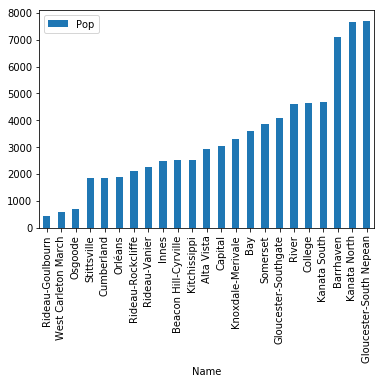

In [113]:
AsianPop= pd.read_excel('Documents\Coursera - IBM data science\capstone\Ward\Asian pop.xls',sheet_name="Sheet2")
AsianPop.head()
AsianPop.sort_values(by='Pop', inplace =True)
ax = AsianPop.plot.bar(x='Name', y='Pop', rot=90)
ax

In [55]:
Ward_data2=Ward_data1.merge(AsianPop, left_on='ELEMENTLE1', right_on='Ward', how='right').fillna(0)
Ward_data2=Ward_data2.sort_values(by='Pop', ascending=True)
Ward_data2.head()

,ELEMENTLE1,ELEMENTLEV,type,coordinates,geo,Ward,Pop,Name
8,Ward 21,21.0,Polygon,"[[[-75.62426645534809, 45.12316355208995], [-7...","Polygon[[[-75.62426645534809, 45.1231635520899...",Ward 21,425,Rideau-Goulbourn
2,Ward 5,5.0,Polygon,"[[[-75.94418303167772, 45.28932690688253], [-7...","Polygon[[[-75.94418303167772, 45.2893269068825...",Ward 5,585,West Carleton March
7,Ward 20,20.0,Polygon,"[[[-75.44224679333772, 45.33262211140991], [-7...","Polygon[[[-75.44224679333772, 45.3326221114099...",Ward 20,695,Osgoode
3,Ward 6,6.0,Polygon,"[[[-75.92383056524879, 45.30092474370078], [-7...","Polygon[[[-75.92383056524879, 45.3009247437007...",Ward 6,1845,Stittsville
6,Ward 19,19.0,Polygon,"[[[-75.56605916418044, 45.41702016280486], [-7...","Polygon[[[-75.56605916418044, 45.4170201628048...",Ward 19,1865,Cumberland


In [61]:
Ward_data2.dtypes

ELEMENTLE1      object
ELEMENTLEV     float64
type            object
coordinates     object
geo             object
Ward            object
Pop              int64
Name            object
dtype: object

####  Ottawa Coordinates

In [14]:
address = 'Ottawa, ON'

geolocator = Nominatim(user_agent="on_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
#latitue = 45.421106
#longitude = -75.690308
print('The geograpical coordinate of Ottawa are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Ottawa are 45.421106, -75.690308.


In [56]:
map_Ott = folium.Map(location=[latitude, longitude], zoom_start=11)

style = {'fillColor': '#ffffff', 'color': '#3339ff', 'weight': 0.9}
style1 = {'fillColor': '#ffffff', 'color': '#00313c', 'weight': 1}

folium.GeoJson(OttawaJson,
    name='Neighbourhoods',
    style_function=lambda x: style).add_to(map_Ott)

folium.GeoJson(WardJson,
    name='WardJson',
    style_function=lambda x: style1).add_to(map_Ott)
folium.LayerControl().add_to(map_Ott)
print ('Map of Ottawa with Neighbourhood and Ward Boundaries Layers')
map_Ott


Map of Ottawa with Neighbourhood and Ward Boundaries Layers


In [71]:
Ward_data2.head()


,ELEMENTLE1,ELEMENTLEV,type,coordinates,geo,Ward,Pop,Name
8,Ward 21,21.0,Polygon,"[[[-75.62426645534809, 45.12316355208995], [-7...","Polygon[[[-75.62426645534809, 45.1231635520899...",Ward 21,425,Rideau-Goulbourn
2,Ward 5,5.0,Polygon,"[[[-75.94418303167772, 45.28932690688253], [-7...","Polygon[[[-75.94418303167772, 45.2893269068825...",Ward 5,585,West Carleton March
7,Ward 20,20.0,Polygon,"[[[-75.44224679333772, 45.33262211140991], [-7...","Polygon[[[-75.44224679333772, 45.3326221114099...",Ward 20,695,Osgoode
3,Ward 6,6.0,Polygon,"[[[-75.92383056524879, 45.30092474370078], [-7...","Polygon[[[-75.92383056524879, 45.3009247437007...",Ward 6,1845,Stittsville
6,Ward 19,19.0,Polygon,"[[[-75.56605916418044, 45.41702016280486], [-7...","Polygon[[[-75.56605916418044, 45.4170201628048...",Ward 19,1865,Cumberland


In [74]:

folium.GeoJson(Ward_data2,
               name="STUFF",
              
              tooltip=folium.features.Tooltip(fields=('properties')['ELEMENTLEV'])
              ).add_to(map_Ott)



TypeError: string indices must be integers

In [83]:
variable = 'Pop'

colormap = folium.LinearColormap(colors=["red","orange","yellow","green"],vmin=Ward_data2.loc[Ward_data2[variable]>0, variable].min(), 
                                 vmax=Ward_data2.loc[Ward_data2[variable]>0, variable].max()).to_step(n=5)
colormap.caption = "2011 Ward stuff"


folium.GeoJson(Ward_data2[['geo','Name',variable]],
               name="STUFF",
              style_function=lambda x: {style1},
              tooltip=folium.features.Tooltip(fields=['Name',variable],
                                              aliases=['Place','2015 Median Income'], 
                                              labels=True, 
                                              sticky=True,
                                              toLocaleString=True
                                             )
              ).add_to(map_Ott)

ValueError: Cannot render objects with any missing geometries:                                                   geo
8   Polygon[[[-75.62426645534809, 45.1231635520899...
2   Polygon[[[-75.94418303167772, 45.2893269068825...
7   Polygon[[[-75.44224679333772, 45.3326221114099...
3   Polygon[[[-75.92383056524879, 45.3009247437007...
6   Polygon[[[-75.56605916418044, 45.4170201628048...
23  Polygon[[[-75.46934426444325, 45.4753698952177...
21  Polygon[[[-75.70130253434756, 45.4430640318887...
20  Polygon[[[-75.6627573022772, 45.41699057071138...
22  Polygon[[[-75.51842914859748, 45.4744834550700...
19  Polygon[[[-75.59720774921863, 45.4123062716718...
11  Polygon[[[-75.70923877018788, 45.3968585192784...
14  Polygon[[[-75.65665879118683, 45.4176331615874...
13  Polygon[[[-75.70828998261226, 45.3954337792691...
18  Polygon[[[-75.75368486906767, 45.3368611862862...
4   Polygon[[[-75.92236242441996, 45.3656654253230...
10  Polygon[[[-75.68080777349253, 45.4190044950599...
9   Polygon[[[-75.69584756345976, 45.3207353874798...
12  Polygon[[[-75.70923877018788, 45.3968585192784...
5   Polygon[[[-75.75459729587293, 45.3704210619357...
17  Polygon[[[-75.89980279521252, 45.2905779325662...
0   Polygon[[[-75.72194142856912, 45.2415277940071...
1   Polygon[[[-75.88747156912267, 45.3197500137928...
15  Polygon[[[-75.70514001327093, 45.2564402323925...
16  Polygon[[[-75.69839694339684, 45.2994544207831...

In [108]:
NeighPop = pd.read_csv('Documents/Coursera - IBM data science/capstone/pop.csv', sep=',', encoding='latin-1')
NeighPop_dict = NeighPop.set_index('Name')['Cen2011POP']
WardPop_dict = Ward_data2.set_index('ELEMENTLE1')['Pop']


In [30]:
NeighPop_dict.dtype


dtype('int64')

In [89]:
APop_dict = AsianPop.set_index('Name')['Pop']
APop_dict

Name
Rideau-Goulbourn            425
West Carleton March         585
Osgoode                     695
Stittsville                1845
Cumberland                 1865
Orléans                    1900
Rideau-Rockcliffe          2125
Rideau-Vanier              2270
Innes                      2480
Beacon Hill-Cyrville       2525
Kitchissippi               2535
Alta Vista                 2935
Capital                    3045
Knoxdale-Merivale          3295
Bay                        3600
Somerset                   3845
Gloucester-Southgate       4065
River                      4605
College                    4655
Kanata South               4670
Barrhaven                  7090
Kanata North               7650
Gloucester-South Nepean    7710
Name: Pop, dtype: int64

In [32]:
from branca.colormap import linear

colormap = linear.YlGn_09.scale(
    NeighPop.Cen2011POP.min(),
    NeighPop.Cen2011POP.max())
'''
colormap1 = linear.YlGn_09.scale(
    APop_dict.Pop.min(),
    APop_dict.Pop.max())
'''

'\ncolormap1 = linear.YlGn_09.scale(\n    APop_dict.Pop.min(),\n    APop_dict.Pop.max())\n'

In [111]:
from branca.colormap import linear

colormap = linear.YlGn_09.scale(
    NeighPop.Cen2011POP.min(),
    NeighPop.Cen2011POP.max())

colormap1 = folium.LinearColormap(colors=["red","orange","yellow","green"],vmin=Ward_data2.loc[Ward_data2[variable]>0, variable].min(), 
                                 vmax=Ward_data2.loc[Ward_data2[variable]>0, variable].max()).to_step(n=5)

colormap.caption = "2011 Neighbourhood Population"

map_Ott = folium.Map(location=[latitude, longitude], zoom_start=10)

style = {'fillColor': '#ffffff', 'color': '#00313c', 'weight': 0.9}
style1 = {'fillColor': '#ffffff', 'color': '#e33e1b', 'weight': 1}
folium.GeoJson(OttawaJson,
    name='Neighbourhoods',
    style_function=lambda x: style).add_to(map_Ott)

folium.GeoJson(
    OttawaJson,
    name='Cen2011POP',
    style_function=lambda feature: {
        'fillColor': colormap(NeighPop_dict[feature['properties']['Name']]), 
        'color': 'black',
        'weight': 1,
        'dashArray': '5, 5',
        'fillOpacity': 0.9,
    }
).add_to(map_Ott)


folium.GeoJson(WardJson,
    name='WardJson',
    style_function=lambda x: style1
).add_to(map_Ott)



colormap.add_to(map_Ott)

folium.LayerControl(autoZIndex=False, collapsed=False).add_to(map_Ott)

map_Ott

In [ ]:
'''
folium.GeoJson(
    Ward_data,
    name='test',
    style_function=lambda feature: {
        'fillColor': colormap1(APop_dict['Name']), 
        'color': 'black',
        'weight': 1,
        'dashArray': '5, 5',
        'fillOpacity': 0.9,
    }
).add_to(map_Ott)
'''

In [ ]:
D= pd.read_csv('Documents\Coursera - IBM data science\capstone\Census Profile  by FSA\98-401-X2016046_English_CSV_data.csv')
D.head()


In [ ]:
print(D.shape)

In [ ]:
D_ottawa = D[D['GEO_NAME'].isin(['K0A','K1A','K1B','K1C','K1E','K1G','K1H','K1J','K1K','K1L','K1M','K1N','K1P','K1R','K1S','K1T','K1V','K1W','K1X','K1Y','K1Z','K2A','K2B','K2C','K2E','K2G','K2H','K2J','K2K','K2L','K2M','K2P','K2R','K2S','K2T','K2V','K2W','K4A','K4B','K7R'
]) ]
D_ottawa.to_csv(r'Documents\Coursera - IBM data science\capstone\Census Profile  by FSA\D_ottawa.csv')

In [ ]:
C= pd.read_csv('Documents\Coursera - IBM data science\capstone\AllOttawaPCLatLng2.csv')
C.head()

# Exploring Ottawa's Eateries

### Get Ottawa's Coordinates 

### Ottawa Postal codes

In [ ]:
#import XXX.csv into a dataframe
OttData= pd.read_csv('Documents/Coursera - IBM data science/capstone/RedOttawaPCLatLng.csv')
OttData.head()

### Map of Ottawa with Neighborhood Markers

In [ ]:
OttData= pd.read_csv('Documents/Coursera - IBM data science/capstone/RedOttawaPCLatLng.csv')
# create map of Ottawa using latitude and longitude values
map_Ott = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, n in zip(OttData['Latitude'], OttData['Longitude'], OttData['FSA'],):
    label = '{},{},{}'.format(n,lat,lng)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Ott)  
    
map_Ott

### Collect Restaurant Venues from Foursquare 

In [ ]:
CLIENT_ID = 'GBYHRELS0D253V5QVTU0L5OIM3AVO04U2YNGAND3I22VPFAM' # your Foursquare ID
CLIENT_SECRET = 'MRVSW1DPQGGUL21KSHWUBRJV0RT5KTD0L4P1MGJXVKFV51S3' # your Foursquare Secret
VERSION = '20190710'

In [ ]:
def getNearbyVenues(names, latitudes, longitudes, radius=10000, query='Food', limit=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name,lat,lng)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&query={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius,
            limit,
            query)
           
        # make the GET request
        try:
            results = requests.get(url).json()["response"]['groups'][0]['items']
        except:
            print ('na')
            pass
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['id'],
            v['venue']['name'], 
            v['venue']['location']['formattedAddress'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'VID',  
                  'Venue', 
                  'Address',
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [ ]:
venues = getNearbyVenues(names=OttData['FSA'],
                         latitudes=OttData['Latitude'],
                         longitudes=OttData['Longitude']
                        )

### Adding Additional FSA's Venues


lat='45.2708807'
lng='-75.72452517'
radius=10000
query='Food'
limit=100
name='K2J'

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&query={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    lat, 
    lng, 
    radius,
    limit,
    query)
results_new = requests.get(url).json()["response"]['groups'][0]['items']

venues_list=[]
venues_list.append([(
    name, 
    lat, 
    lng, 
    v['venue']['id'],
    v['venue']['name'], 
    v['venue']['location']['formattedAddress'], 
    v['venue']['location']['lat'], 
    v['venue']['location']['lng'],  
    v['venue']['categories'][0]['name']) for v in results_new])

new_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
new_venues.columns = ['Neighborhood', 
  'Neighborhood Latitude', 
  'Neighborhood Longitude', 
  'VID',  
  'Venue', 
  'Address',            
  'Venue Latitude', 
  'Venue Longitude', 
  'Venue Category']


In [ ]:
#new_venues
#new_venues.to_csv (r'Documents/Coursera - IBM data science/capstone/new_venues1.csv',index=False, header = True)

venues.append(new_venues, ignore_index=True)
print('The shape of the new_venues dataframe:',new_venues.shape)
print('The shape of the after venues dataframe:',venues.shape)

### Save 
Don't forget to change version numbers
combine venue CSV files into one (once done import)

In [ ]:
#venues.to_csv (r'Documents/Coursera - IBM data science/capstone/venues5.csv',index=False, header = True)

In [ ]:
venues1= pd.read_csv('Documents/Coursera - IBM data science/capstone/venues5.csv')

print('The shape of the venues dataframe:',venues1.shape)
print('There are {} uniques categories.'.format(len(venues1['Venue Category'].unique())))
venues1.head()

In [ ]:
#BBT = venues[['VID','Venue','Venue Latitude','Venue Longitude']]
#BBT.sort_values("VID", inplace = True) 
#BBT.drop_duplicates(subset ="VID", 
#                     inplace = True) 
#print('The shape of the venues dataframe:',BBT.shape)
#print('There are {} uniques categories.'.format(len(BBT['Venue Category'].unique())))
#BBT.reset_index()
#BBT



### List of Restaurants in Ottawa

In [ ]:
#Restaurants = venues[['VID','Venue','Address','Venue Latitude','Venue Longitude','Venue Category']].copy()
#Restaurants.sort_values('VID', inplace = True) 
#Restaurants.drop_duplicates(['VID'], inplace = True)
#Restaurants.reset_index(drop=True, inplace=True)

Restaurants= pd.read_csv('Documents/Coursera - IBM data science/capstone/Restaurants2.csv')
print('The shape of the venues dataframe:',Restaurants.shape)
Restaurants.head()


In [ ]:
#Restaurants.to_csv (r'Documents/Coursera - IBM data science/capstone/Restaurants1.csv',index=False, header = True)

### Types of Ottawa Eateries

In [ ]:
Restaurants['Venue Category'].value_counts().plot(kind='barh',figsize=(4,18))

In [ ]:
#check counts
#Restaurants.groupby(['VID']).size().reset_index(name='counts')

Restaurants.groupby(['Venue Category']).size().reset_index(name='counts')

In [ ]:
# create map of Ottawa using latitude and longitude values
map_Ott = folium.Map(location=[latitude, longitude], zoom_start=12)

style = {'fillColor': '#ffffff', 'color': '#3339ff', 'weight': 0.9}
folium.GeoJson(OttawaJson,
    name='geojson',
    style_function=lambda x: style).add_to(map_Ott)


# add markers to map  Venue Latitude = Lat ; Venue Longitude = Long
for lat, lng, v in zip(Restaurants['Lat'], Restaurants['Long'], Restaurants['Venue'],):
    label = '{}'.format(v)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        name='markers',
        radius=3,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#f01c1c',
        fill_opacity=0.7,
        weight =0.5,
        
        parse_html=False).add_to(map_Ott)  
folium.LayerControl().add_to(map_Ott)

map_Ott

In [ ]:
Type = ['Asian Restaurant','Chinese Restaurant','Japanese Restaurant','Korean Restaurant','Noodle House','Sushi Restaurant','Thai Restaurant']
Type2 =['Vietnamese Restaurant']

#Asian = Restaurants['Venue Category']isin(Type)
Asian = Restaurants[Restaurants['Venue Category'].isin(Type)]
Asian2 = Restaurants[Restaurants['Venue Category'].isin(Type2)]

#gapminder.year.isin(years)

print('The shape of the venues dataframe:',Asian.shape)



In [ ]:
#Asian.to_csv (r'Documents/Coursera - IBM data science/capstone/Rest_Asian.csv',index=False, header = True)
#Asian2.to_csv (r'Documents/Coursera - IBM data science/capstone/Rest_Viet.csv',index=False, header = True)

Asian= pd.read_csv('Documents/Coursera - IBM data science/capstone/Rest_Asian.csv')
Asian.head()

In [ ]:
# create map of Ottawa using latitude and longitude values
Map_Asian = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map  Venue Latitude = Lat ; Venue Longitude = Long
for lat, lng, v in zip(Asian['Lat'], Asian['Long'], Restaurants['Venue'],):
    label = '{}'.format(v)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(Map_Asian)  
    
Map_Asian

In [ ]:
print ("Asian Restaurants within restaurant density map")
from folium import FeatureGroup, LayerControl, Map, Marker
from folium.plugins import HeatMap
xmap = HeatMap( zip(Restaurants.Lat.values, Restaurants.Long.values),
                     min_opacity=0.2,
                     radius=13, blur=15,
                     max_zoom=1
                 )
Map_Asian.add_child(xmap)

In [ ]:
def getRatings(VID,V):
    count = 0
    venues_ratings=[]
    for ID, VenueName in zip(VID,V):
        count = count +1
        
        
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/{}?&client_id={}&client_secret={}&v={}'.format(
            ID,
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION)
           
        # make the GET request
        try:
            results = requests.get(url).json()["response"]
            print (results)
        except:
            print ('Bad', count,VenueName, ID)
            pass
        
        try:
            r=results['venue']['rating']
        except:
            r=None
        try:
            stat=results['venue']['stats']['tipCount']
        except:
            stat=None
        try:
            url=results['venue']['url']
        except:
            url=None
        try:
            hours=results['venue']['hours']
        except:
            hours=None
        try:
            popular=results['venue']['popular']
        except:
            popular=None
        try:
            menue=results['venue']['menue']
        except:
            menue=None
        try:
            price=results['venue']['price']['tier']
        except:
            price=None
        try:
            likes=results['venue']['likes']['count']
        except:
            likes=None
        try:
            phrases=results['phrases']
        except:
            phrases=None
        try:
            twitter=results['venue']['contact']['twitter']
        except:
            twitter=None
        try:
            instagram=results['venue']['contact']['instagram']
        except:
            instagram=None     
        try:
            facebook=results['venue']['contact']['facebook']
        except:
            facebook=None   
            
            # return only relevant information for each nearby venue
        venues_ratings.append([
                ID, 
                r,
                stat,
                url,
                hours,
                popular,
                menue,
                price,
                likes,
                phrases,
                twitter,
                instagram,
                facebook])
        print(count,VenueName, ID,r,facebook)

        if count == 50:
            break
            
            
    rates = pd.DataFrame (venues_ratings)
    #rates = pd.DataFrame([item for venue_rating in venues_ratings for item in venue_rating])
    rates.columns = ['VId','Rating','Stats','URL','Hours','Popular','Menue', 'Price', 'Likes','Phrases','Twitter','Insta','FB']
         
    return(rates)


In [ ]:
Ratings = getRatings(VID = Asian['VID'], V = Asian['Venue'])

In [ ]:
#Ratings.to_csv (r'Documents/Coursera - IBM data science/capstone/Ratings3.csv',index=False, header = True)
Ratings= pd.read_csv('Documents/Coursera - IBM data science/capstone/Ratings_final.csv')
Ratings.set_index (["VId"],inplace=True)
Ratings.head()

In [ ]:
Asian= pd.read_csv('Documents/Coursera - IBM data science/capstone/Rest_Asian.csv')
Asian.set_index(["VID"],inplace=True)
Asian.head()

### Merge Venue and Rating Data 

In [ ]:
AsianRest = pd.concat([Asian, Ratings], axis=1, join='inner')
AsianRest.reset_index() 
AsianRest.head()

### Clean Ratings

In [ ]:
Ratings= pd.read_csv('Documents/Coursera - IBM data science/capstone/Ratings_final.csv')
#replace all Ratings with Na to -1
Ratings['Rating'].fillna(-1,inplace=True)
Ratings['URL'].fillna(0,inplace=True)
Ratings['URL']=Ratings['URL'].apply(lambda x: 1 if x!=0 else 0)

Ratings['Twitter'].fillna(0,inplace=True)
Ratings['Twitter']=Ratings['Twitter'].apply(lambda x: 1 if x!=0 else 0)

Ratings['Insta'].fillna(0,inplace=True)
Ratings['Insta']=Ratings['Insta'].apply(lambda x: 1 if x!=0 else 0)

Ratings['FB'].fillna(0,inplace=True)
Ratings['FB']=Ratings['FB'].apply(lambda x: 1 if x!=0 else 0)

Ratings2 = Ratings[['VId','Rating','Stats','URL','Price','Likes']]
Ratings2

In [ ]:
# set number of clusters
kclusters = 5

Ratings3 = Ratings2.drop('VId', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Ratings3)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

In [ ]:
# add clustering labels
Ratings2.insert(0, 'Cluster Labels', kmeans.labels_)


In [ ]:
Ratings2.head()

In [ ]:
Ratings_merged = Ratings2[['Cluster Labels','VId']]
Ratings_merged.head()

In [ ]:

Ratings_merged.set_index (["VId"],inplace=True)

Ratings_merged1 = pd.concat([Asian, Ratings_merged], axis=1, join='inner')
Ratings_merged1.reset_index() 
Ratings_merged1.head()

In [ ]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Ratings_merged1['Lat'], Ratings_merged1['Long'], Ratings_merged1['Venue'], Ratings_merged1['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=4,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color='black',
        #fill_color=rainbow[cluster-1],
        fill_opacity=1).add_to(map_clusters)
       
map_clusters

In [ ]:
from folium import FeatureGroup, LayerControl, Map, Marker
from folium.plugins import HeatMap
xmap = HeatMap( zip(Restaurants.Lat.values, Restaurants.Long.values),
                     min_opacity=0.1,
                     radius=11, blur=15,
                     max_zoom=1
                 )
map_clusters.add_child(xmap)

In [ ]:
Ratings2.groupby('Cluster Labels').mean()

Cluster 0 (Red) : Low Rating, Low Stats, Low Online Presence, Moderate prices, Low Likes
Cluster 1 (Purple): High Rating, High Stats, Medium Online Presence, Low  prices, High Likes
Cluster 2 (Blue): Moderate / High Rating, Moderate Stats, High Online Presense, High prices, Moderate Likes
Cluster 3 (Mint): Moderate Rating, Low/Moderate Stats, Medium Online presence, Low/Moderate prices, low/Moderate likes
Cluster 4 (Orange): No rating, low stats, no online presences, Low prices, Low likes

In [ ]:
Ratings2.loc[Ratings2['Cluster Labels'] == 0, Ratings2.columns[[1] + list(range(2, Ratings2.shape[1]))]]

In [ ]:
Ratings2.loc[Ratings2['Cluster Labels'] == 1, Ratings2.columns[[1] + list(range(2, Ratings2.shape[1]))]]

In [ ]:
Ratings2.loc[Ratings2['Cluster Labels'] == 2, Ratings2.columns[[1] + list(range(2, Ratings2.shape[1]))]]

In [ ]:
Ratings2.loc[Ratings2['Cluster Labels'] == 3, Ratings2.columns[[1] + list(range(2, Ratings2.shape[1]))]]

In [ ]:
Ratings2.loc[Ratings2['Cluster Labels'] == 4, Ratings2.columns[[1] + list(range(2, Ratings2.shape[1]))]]

In [ ]:
results = requests.get(url).json()["response"]['groups'][0]['items']
#results

In [ ]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [ ]:
nearby_venues = json_normalize(results) # flatten JSON

In [ ]:
#venues = results['response']['groups'][0]['items']

    
#nearby_venues = json_normalize(results) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

In [ ]:
nearby_venues.size

### Map of Ottawa

In [ ]:
# create map of Ottawa using latitude and longitude values
map_Ott = folium.Map(location=[latitude, longitude], zoom_start=14)

# add markers to map
for lat, lng, venue in zip(nearby_venues['lat'], nearby_venues['lng'], nearby_venues['name'],):
    label = '{}'.format(venue)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Ott)  
    
map_Ott